**<h1> Manipulating Images </h1>**


Estimated time needed: **60** minutes


<h2>Objectives</h2>


In this lab, you will learn how to manipulate images, both as arrays and PIL image objects. You will learn how to copy an image to avoid aliasing. We will cover flipping images and cropping images. You will also learn to change pixel images; this will allow you to draw shapes, write text and superimpose images over other images.


<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


----


Download the images for the lab:


In [ ]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png -O cat.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png

We will be using these imported functions in the lab:


In [ ]:
import matplotlib.pyplot as plt # thư viện vẽ biểu đồ và hiển thị ảnh
from PIL import Image # thư viện xử lý và mở ảnh
import numpy as np # thư viện tính toán số học với mảng

## Copying Images


If you want to reassign an array to another variable, you should use the `copy` method. 


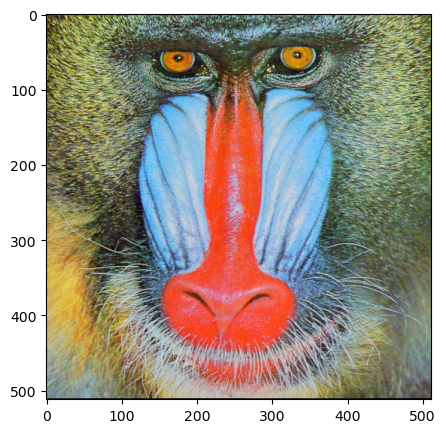

In [ ]:
baboon = np.array(Image.open('baboon.png')) # mở ảnh baboon.png và chuyển thành mảng NumPy
plt.figure(figsize=(5,5)) # tạo khung hình với kích thước 5x5 inch
plt.imshow(baboon ) # hiển thị ảnh lên màn hình
plt.show() # hiển thị kết quả

If we do not apply the method `copy()`, the two variables would point to the same location in memory:


In [ ]:
A = baboon # gán ảnh baboon cho biến A

We use the  `id`  function to find a variable's memory address; we see the objects in the memory space which the variables `A` and `baboon` point to are the same.


In [ ]:
id(A) == id(baboon) # kiểm tra A và baboon có cùng địa chỉ bộ nhớ hay không

True

However, if we apply method `copy()`, their memory addresses are different.


In [ ]:
B = baboon.copy() # tạo bản sao độc lập của baboon
id(B)==id(baboon) # kiểm tra B có cùng địa chỉ bộ nhớ với baboon không

False

There may be unexpected behaviours when two variables point to the same object in memory. Consider the array `baboon`. If we set all its entries to zero, all entires in `A` will become zero as well. However, as `baboon` and `B` points to different objects, the values in `B` will not be affected. 


In [ ]:
baboon[:,:,] = 0 # gán toàn bộ giá trị pixel của ảnh baboon về 0 (ảnh đen)

We can compare the variables <code>baboon</code> and array <code>A</code>:


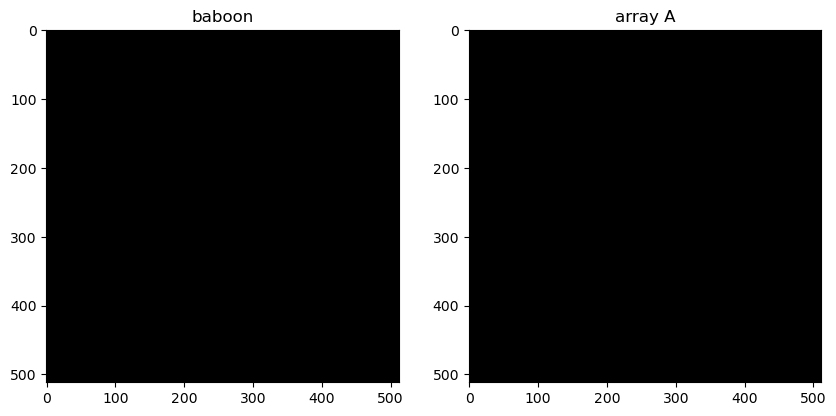

In [ ]:
plt.figure(figsize=(10,10)) # tạo khung hình kích thước 10x10
plt.subplot(121) # tạo ô vẽ thứ 1 (1 hàng, 2 cột, vị trí 1)
plt.imshow(baboon) # hiển thị ảnh baboon
plt.title("baboon") # đặt tiêu đề cho ảnh
plt.subplot(122) # tạo ô vẽ thứ 2 (1 hàng, 2 cột, vị trí 2)
plt.imshow(A) # hiển thị ảnh A
plt.title("array A") # đặt tiêu đề cho ảnh
plt.show() # hiển thị toàn bộ hình

We see they are the same. This behaviour is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable. Variables are references to values on the memory. 

We can also compare <code>baboon</code> and array <code>B</code>:


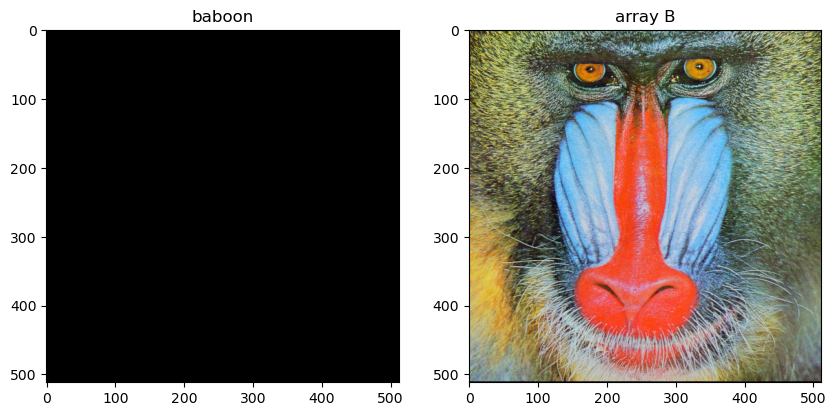

In [ ]:
plt.figure(figsize=(10,10)) # tạo khung hình kích thước 10x10
plt.subplot(121) # tạo ô vẽ thứ 1 (1 hàng, 2 cột, vị trí 1)
plt.imshow(baboon) # hiển thị ảnh baboon
plt.title("baboon") # đặt tiêu đề cho ảnh
plt.subplot(122) # tạo ô vẽ thứ 2 (1 hàng, 2 cột, vị trí 2)
plt.imshow(B) # hiển thị ảnh B
plt.title("array B") # đặt tiêu đề cho ảnh
plt.show() # hiển thị toàn bộ hình


If a PIL function does not return a new image, the same principle applies. We will go over some examples later on. 


## Flipping Images 


Flipping images involves reordering the indices of the pixels such that it changes the orientation of the image. Consider the following image:


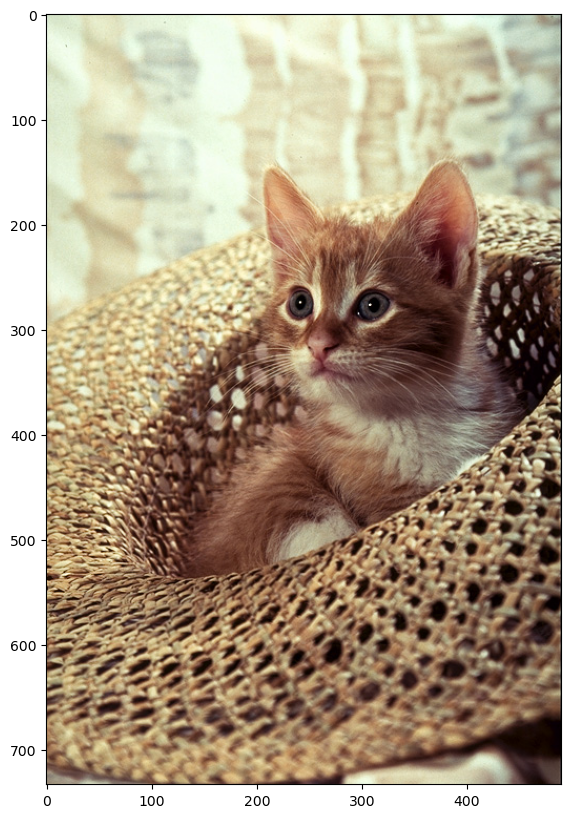

In [ ]:
image = Image.open("cat.png") # mở ảnh cat.png
plt.figure(figsize=(10,10)) # tạo khung hình kích thước 10x10
plt.imshow(image) # hiển thị ảnh
plt.show() # hiển thị kết quả

We can cast it to an array and find its shape:


In [ ]:
array = np.array(image) # chuyển ảnh PIL sang mảng numpy
width, height, C = array.shape # lấy chiều rộng, chiều cao và số kênh màu
print('width, height, C', width, height, C) # in ra kích thước ảnh

width, height, C 733 490 3


Let's flip, i.e rotate vertically, the image. Let's try the traditional approach. First, we create an array of the same size with datatype <code>np.uint8</code>.


In [ ]:
array_flip = np.zeros((width, height, C), dtype=np.uint8) # tạo mảng ảnh mới toàn số 0 với cùng kích thước và kiểu uint8

We assign the first row of pixels of the original array to the new array’s last row. We repeat the process for every row, incrementing the row number from the original array and decreasing the new array’s row index to assign the pixels accordingly. After excecuting the for loop below, `array_flip` will become the flipped image. 


In [ ]:
for i,row in enumerate(array): # duyệt từng hàng của ảnh cùng chỉ số i
    array_flip[width - 1 - i, :, :] = row # gán hàng vào vị trí đối xứng để lật ảnh theo chiều dọc

<code>PIL</code> has several ways to flip an image, for example, we can use the <code>ImageOps</code> module:


In [ ]:
from PIL import ImageOps # nhập module hỗ trợ các phép biến đổi ảnh như lật, xoay, đảo màu

The `flip()` method of `ImageOps` module flips the image. The `mirror()` method will mirror  the image:


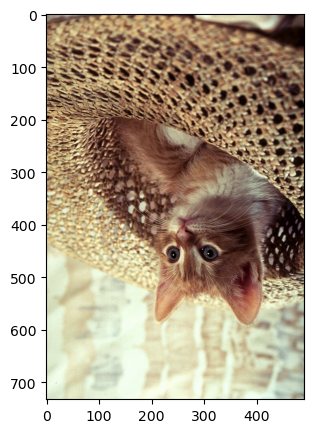

In [ ]:
im_flip = ImageOps.flip(image) # lật ảnh theo chiều dọc
plt.figure(figsize=(5,5)) # tạo khung hình 5x5
plt.imshow(im_flip) # hiển thị ảnh đã lật
plt.show() # hiển thị kết quả

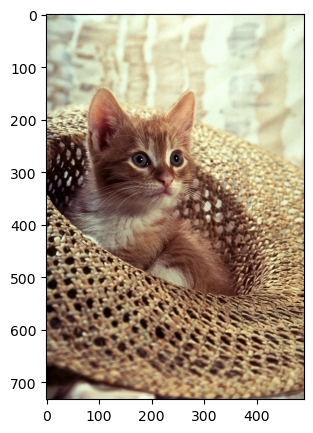

In [ ]:
im_mirror = ImageOps.mirror(image) # lật ảnh theo chiều ngang
plt.figure(figsize=(5,5)) # tạo khung hình 5x5
plt.imshow(im_mirror) # hiển thị ảnh đã lật
plt.show() # hiển thị kết quả

We can use  the <code>transpose()</code> method; the parameter is an integer indicating what type of transposition we would like to perform. For example, we can flip the image using a value of `1`.


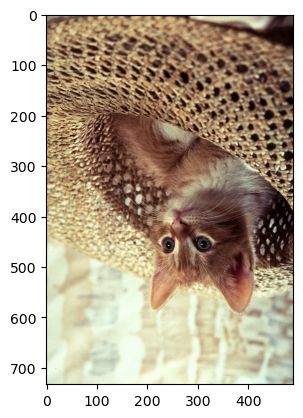

In [ ]:
im_flip = image.transpose(1) # lật ảnh theo chiều dọc bằng phương thức transpose
plt.imshow(im_flip) # hiển thị ảnh đã lật
plt.show() # hiển thị kết quả

The Image module has built-in attributes that describe the type of flip. The values are just integers. Several are shown in the following <code>dict</code>:


In [ ]:
flip = {"FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT, # lật ảnh trái sang phải
        "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM, # lật ảnh trên xuống dưới
        "ROTATE_90": Image.ROTATE_90, # xoay ảnh 90 độ
        "ROTATE_180": Image.ROTATE_180, # xoay ảnh 180 độ
        "ROTATE_270": Image.ROTATE_270, # xoay ảnh 270 độ
        "TRANSPOSE": Image.TRANSPOSE, # chuyển vị ảnh qua đường chéo chính
        "TRANSVERSE": Image.TRANSVERSE} # chuyển vị ảnh qua đường chéo phụ


We see the values are integers.


In [ ]:
flip["FLIP_LEFT_RIGHT"] # lấy giá trị hằng số lật ảnh trái sang phải từ dictionary

0

We can plot each of the outputs using the different  parameter values:


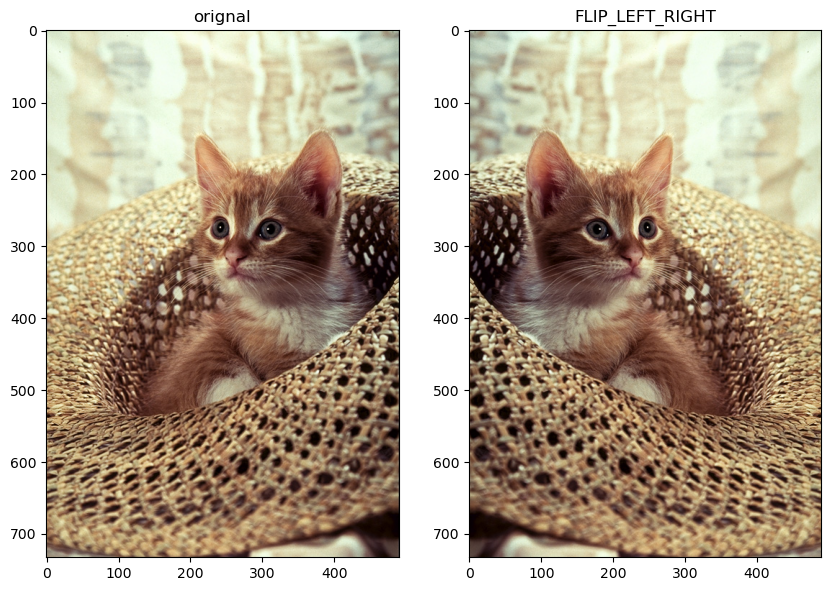

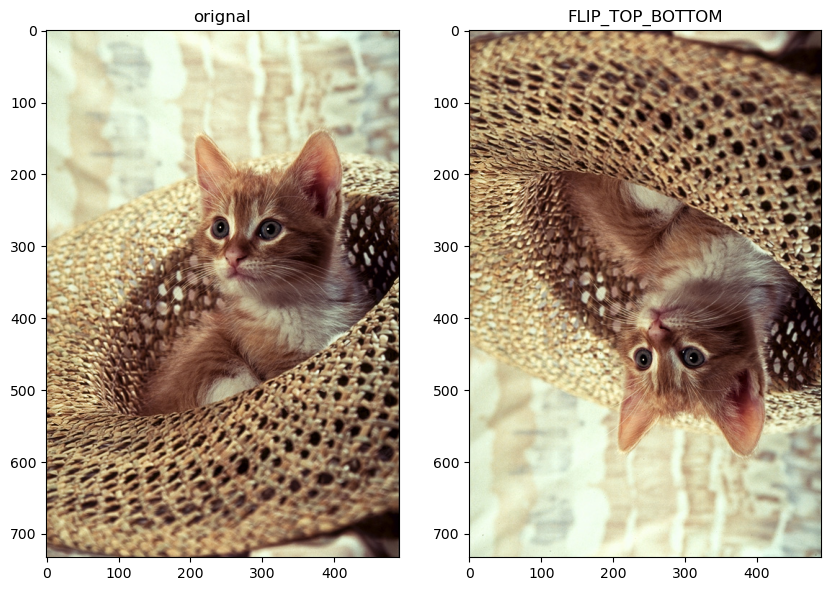

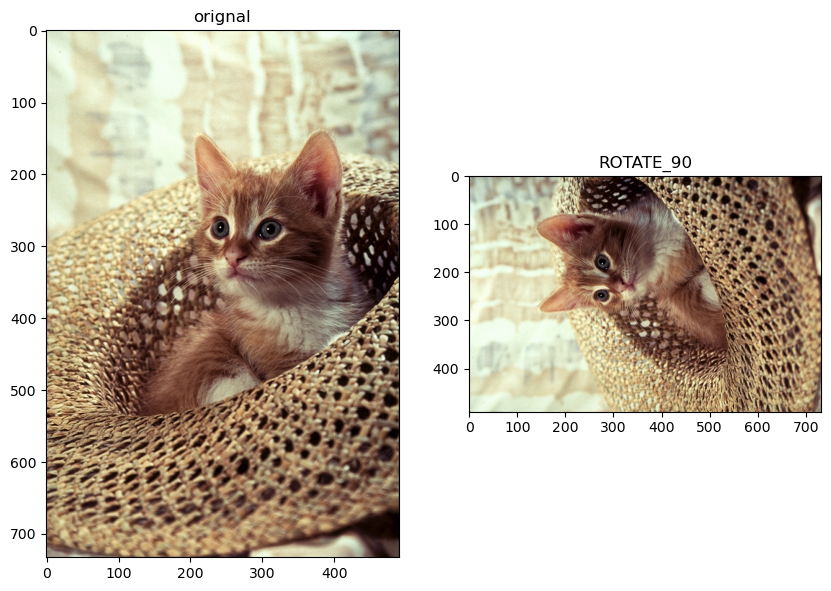

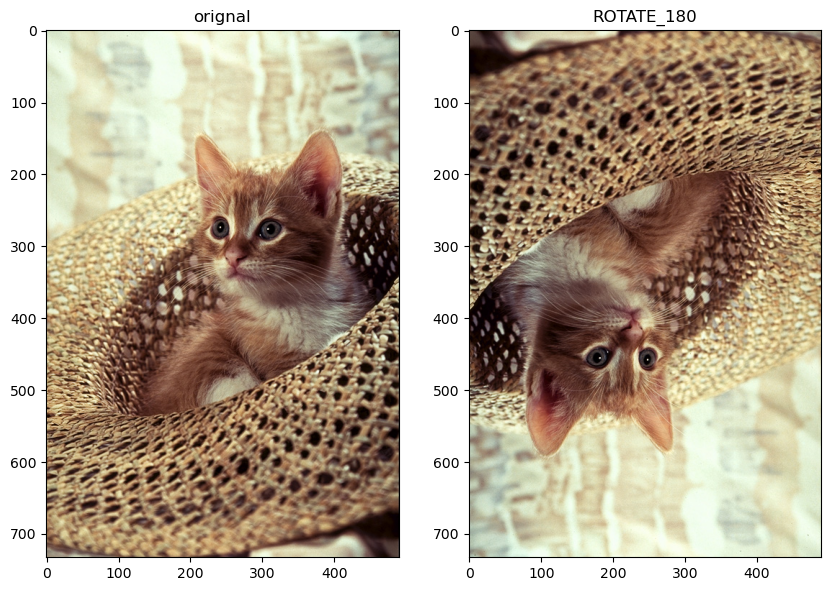

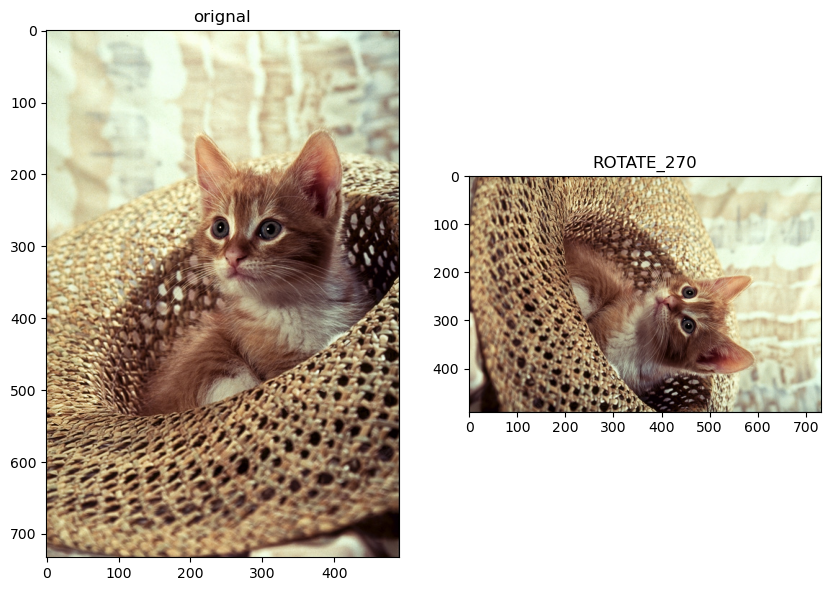

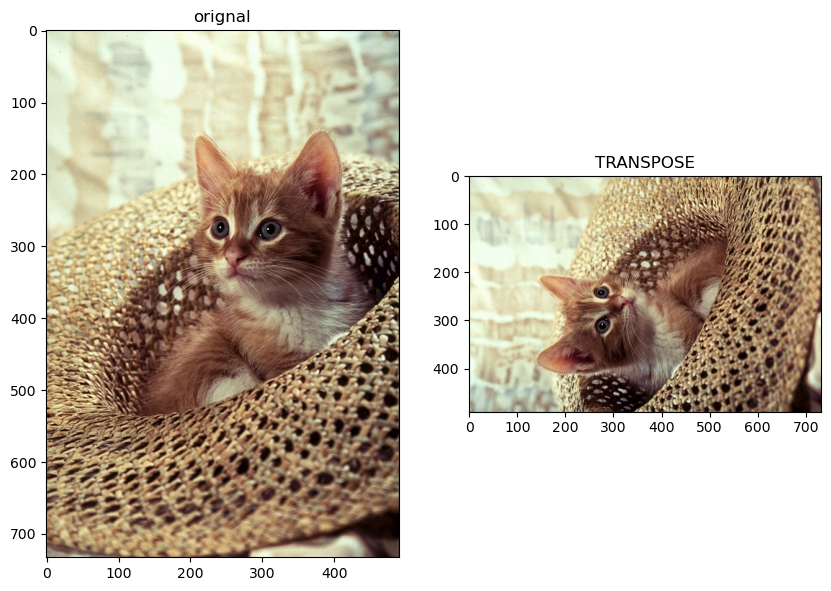

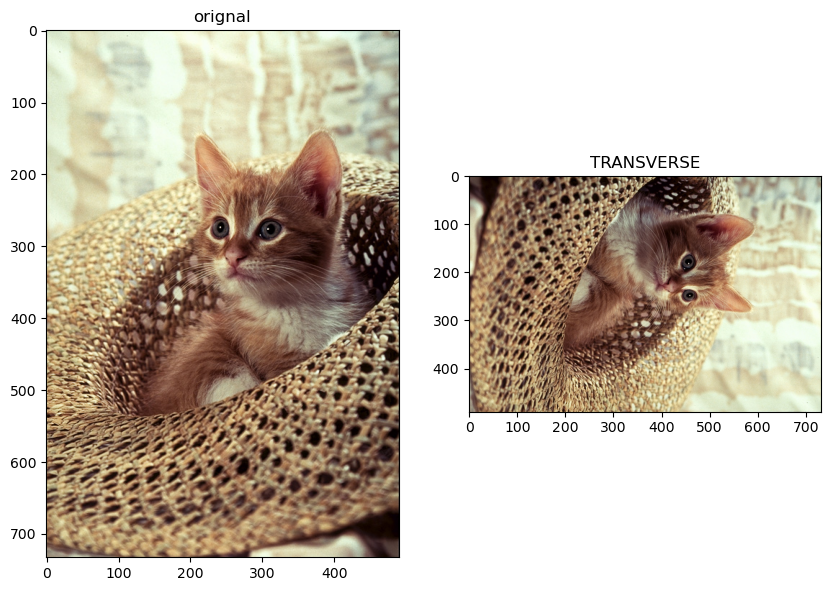

In [ ]:
for key, values in flip.items(): # duyệt từng phép biến đổi trong dictionary
    plt.figure(figsize=(10,10)) # tạo khung hình 10x10
    plt.subplot(1,2,1) # tạo ô bên trái
    plt.imshow(image) # hiển thị ảnh gốc
    plt.title("orignal") # đặt tiêu đề ảnh gốc
    plt.subplot(1,2,2) # tạo ô bên phải
    plt.imshow(image.transpose(values)) # hiển thị ảnh sau biến đổi
    plt.title(key) # đặt tiêu đề theo tên phép biến đổi
    plt.show() # hiển thị kết quả

 ## Cropping an Image


Cropping is the act of "cutting out" a part of an image and throwing out the rest. We can perform cropping using array slicing. 

Let start with a vertical crop: the variable `upper` is the index of the first row that we would like to include in the image, the variable `lower` is the index of the last row we would like to include. We then perform array slicing to obtain the new image. 


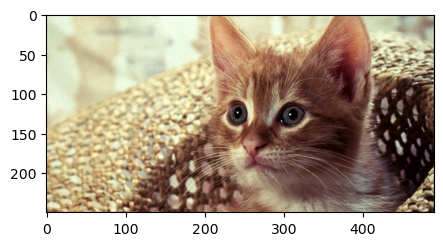

In [ ]:
upper = 150 # chỉ số hàng trên để cắt ảnh
lower = 400 # chỉ số hàng dưới để cắt ảnh
crop_top = array[upper: lower,:,:] # cắt vùng ảnh từ hàng upper đến lower
plt.figure(figsize=(5,5)) # tạo khung hình 5x5
plt.imshow(crop_top) # hiển thị ảnh đã cắt
plt.show() # hiển thị kết quả

Consider the array `crop_top`: we can also crop horizontally. The variable `right` is the index of the first column that we would like to include in the image and the variable `left` is the index of the last column we would like to include in the image.


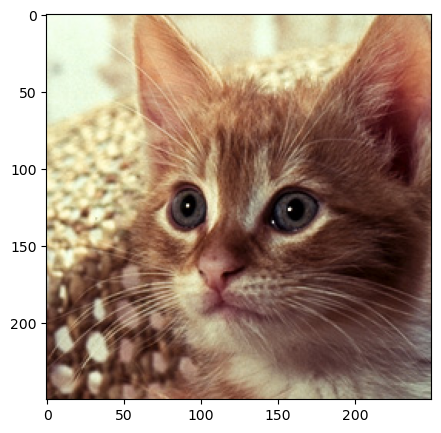

In [ ]:
left = 150 # chỉ số cột bên trái để cắt ảnh
right = 400 # chỉ số cột bên phải để cắt ảnh
crop_horizontal = crop_top[:,left:right,:] # cắt tiếp theo chiều ngang
plt.figure(figsize=(5,5)) # tạo khung hình 5x5
plt.imshow(crop_horizontal) # hiển thị ảnh đã cắt
plt.show() # hiển thị kết quả

You can crop the PIL image using the <code>crop()</code> method, using the parameters from above Set the cropping area with <code>box=(left, upper, right, lower)</code>.


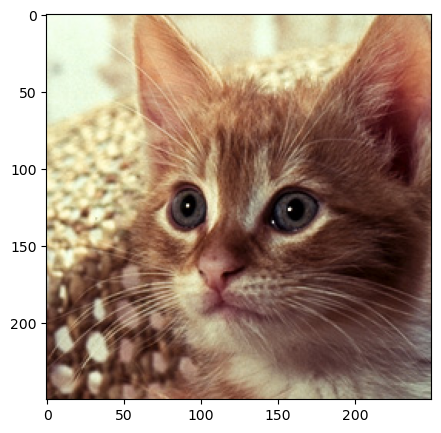

In [ ]:
image = Image.open("cat.png") # mở ảnh cat.png
crop_image = image.crop((left, upper, right, lower)) # cắt ảnh theo tọa độ (left, upper, right, lower)
plt.figure(figsize=(5,5)) # tạo khung hình 5x5
plt.imshow(crop_image) # hiển thị ảnh đã cắt
plt.show() # hiển thị kết quả

We can also flip the new image:


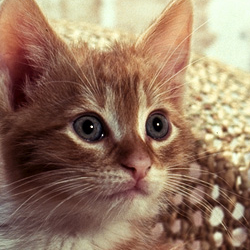

In [ ]:
crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT) # lật ảnh đã cắt theo chiều ngang
crop_image # hiển thị đối tượng ảnh crop_image

## Changing Specific Image Pixels


We can change specific image pixels using  array indexing; for example, we can set  all the green and blue channels in the original image we cropped to zero:


In [ ]:
array_sq = np.copy(array) # tạo bản sao độc lập của mảng ảnh
array_sq[upper:lower, left:right, 1:3] = 0 # đặt kênh G và B của vùng chọn về 0

We can compare the results with the new image. 


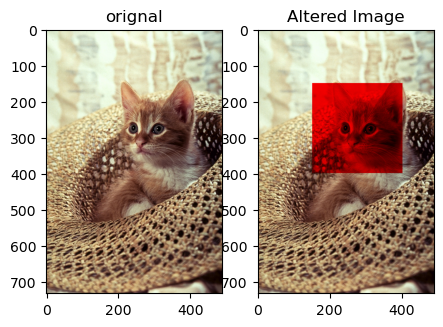

In [ ]:
plt.figure(figsize=(5,5)) # tạo khung hình 5x5
plt.subplot(1,2,1) # tạo ô bên trái
plt.imshow(array) # hiển thị ảnh gốc
plt.title("orignal") # đặt tiêu đề ảnh gốc
plt.subplot(1,2,2) # tạo ô bên phải
plt.imshow(array_sq) # hiển thị ảnh đã chỉnh sửa
plt.title("Altered Image") # đặt tiêu đề ảnh đã chỉnh sửa
plt.show() # hiển thị kết quả

We can also use the `ImageDraw` module from `PIL` library, which provides simple 2D graphics for Image objects 


In [ ]:
from PIL import ImageDraw # nhập module để vẽ hình và chú thích lên ảnh

We will copy the image object:


In [ ]:
image_draw = image.copy() # tạo bản sao ảnh để vẽ lên mà không ảnh hưởng ảnh gốc

The draw constructor creates an object that can be used to draw in the given image. The input <code>im</code> is the image we would like to draw in.



In [ ]:
image_fn = ImageDraw.Draw(im=image_draw) # tạo đối tượng vẽ trên ảnh image_draw

Whatever method we apply to the object <code>image_fn</code>, will change the image object <code>image_draw</code>.


We can draw a rectangle using the <code>rectangle</code> function, two important parameters include: <code>xy</code> – the coordinates bounding box  and <code>fill</code> – Color of the rectangle.


In [ ]:
shape = [left, upper, right, lower] # xác định tọa độ hình chữ nhật cần vẽ
image_fn.rectangle(xy=shape,fill="red") # vẽ hình chữ nhật màu đỏ lên ảnh

We can plot the image.


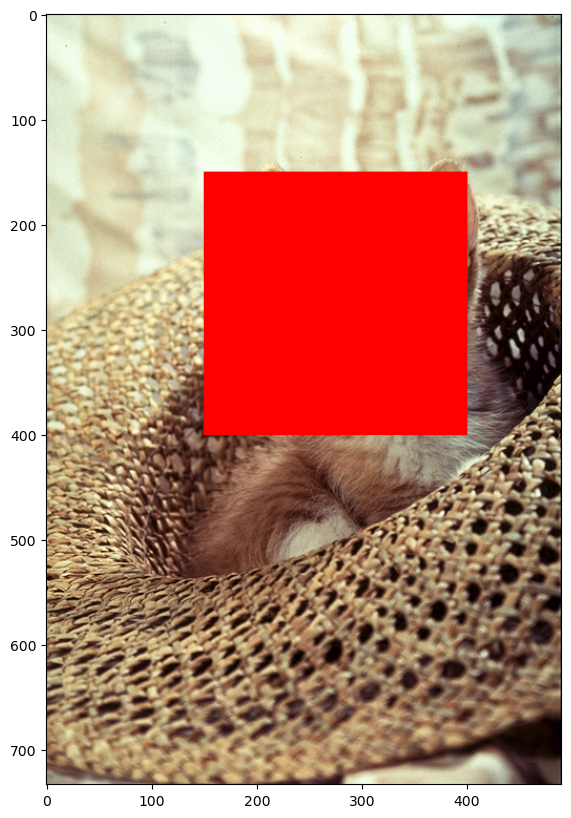

In [ ]:
plt.figure(figsize=(10,10)) # tạo khung hình 10x10
plt.imshow(image_draw) # hiển thị ảnh đã vẽ hình chữ nhật
plt.show() # hiển thị kết quả

There are other shapes we can use. For example, we can also overlay text on an image: we use the ImageFont module to obtain  bitmap fonts.


In [ ]:
from PIL import ImageFont # nhập module để chọn và sử dụng font chữ khi vẽ lên ảnh

We use the text method to place the text on the image. The parameters include `xy` (the top-left anchor coordinates of the text), the parameter `text` (the text to be drawn), and `fill` (the color to use for the text).


In [ ]:
image_fn.text(xy=(0,0),text="box",fill=(0,0,0)) # vẽ chữ "box" tại tọa độ (0,0) với màu đen

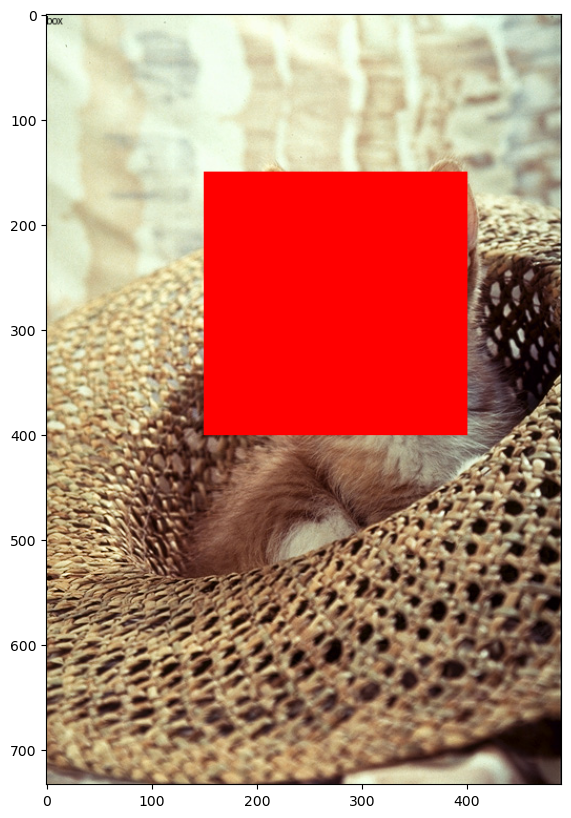

In [ ]:
plt.figure(figsize=(10,10)) # tạo khung hình 10x10
plt.imshow(image_draw) # hiển thị ảnh sau khi thêm chữ
plt.show() # hiển thị kết quả

We can overlay or paste one image over another by reassigning the pixel for one array to the next. Consider the following image array:


In [ ]:
image_lenna = Image.open("lenna.png") # mở ảnh lenna.png
array_lenna = np.array(image_lenna) # chuyển ảnh sang mảng numpy

We can reassign the pixel values as follows:


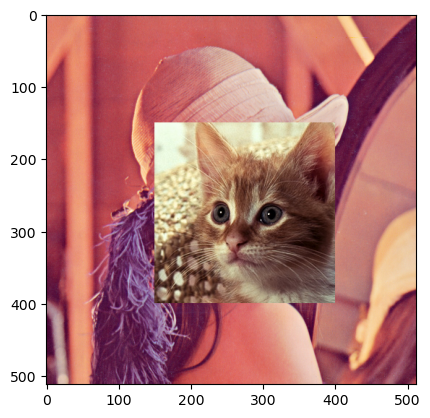

In [ ]:
array_lenna[upper:lower,left:right,:]=array[upper:lower,left:right,:] # chép vùng ảnh từ array sang array_lenna
plt.imshow(array_lenna) # hiển thị ảnh kết quả
plt.show() # hiển thị kết quả

In the same manner, the <code>paste()</code> method allows you to overlay one image over another, with the input being the image you would like to overlay. The parameter box is the left and upper coordinate of the image:


In [ ]:
image_lenna.paste(crop_image, box=(left,upper)) # dán ảnh crop_image vào image_lenna tại vị trí (left, upper)

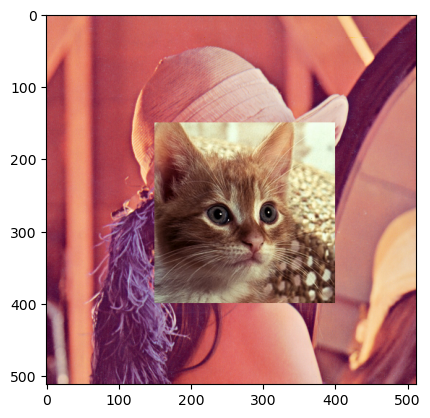

In [ ]:
plt.imshow(image_lenna) # hiển thị ảnh lenna sau khi dán
plt.show() # hiển thị kết quả

We can see the method `copy()` applies to some <code>PIL</code> objects. We create two image objects, we set `new_image` to the `image`, and we use the method `copy()` for the `copy_image` object.


In [ ]:
image = Image.open("cat.png") # mở ảnh cat.png
new_image=image # gán tham chiếu ảnh cho new_image
copy_image=image.copy() # tạo bản sao độc lập của ảnh

Like the array, we see that the same memory address relationship exists. For example, if we don't use the method `copy()`, the image object has the same memory address as the original PIL image object. 


In [ ]:
id(image)==id(new_image) # kiểm tra image và new_image có cùng địa chỉ bộ nhớ không

True

If we use the method <code>copy()</code>, the address is different:


In [ ]:
id(image)==id(copy_image) # kiểm tra image và copy_image có cùng địa chỉ bộ nhớ không

False

If we change the object <code>image</code>, <code>new_image</code> will change, but <code>copy_image</code> will remain the same:


In [ ]:
image_fn= ImageDraw.Draw(im=image) # tạo đối tượng vẽ trực tiếp trên ảnh image
image_fn.text(xy=(0,0),text="box",fill=(0,0,0)) # vẽ chữ "box" tại góc trên trái
image_fn.rectangle(xy=shape,fill="red") # vẽ hình chữ nhật màu đỏ theo tọa độ shape

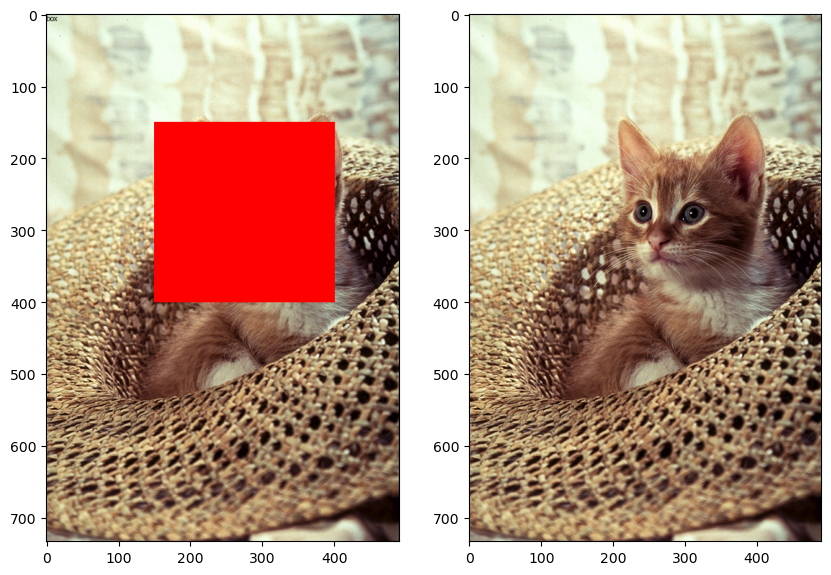

In [ ]:
plt.figure(figsize=(10,10)) # tạo khung hình 10x10
plt.subplot(121) # tạo ô bên trái
plt.imshow(new_image) # hiển thị ảnh new_image
plt.subplot(122) # tạo ô bên phải
plt.imshow(copy_image) # hiển thị ảnh copy_image
plt.show() # hiển thị kết quả

### Question 1:
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a PIL Image object called `im`, flip `im` and create an image called `im_flip`. Mirror `im` and create an image called `im_mirror`. Finally, plot both images.


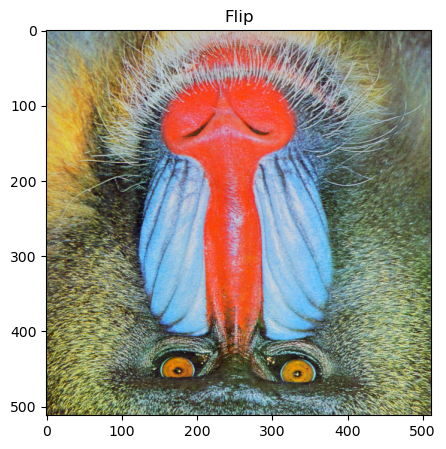

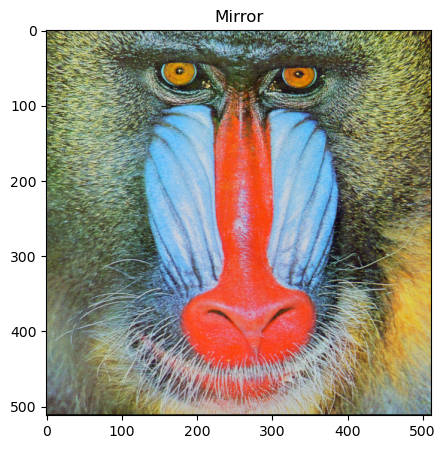

In [ ]:
# write your code here
from PIL import Image, ImageOps # nhập thư viện xử lý ảnh
import matplotlib.pyplot as plt # nhập thư viện hiển thị ảnh

im = Image.open("baboon.png") # mở ảnh và tạo đối tượng PIL Image

im_flip = ImageOps.flip(im) # lật ảnh theo chiều dọc
im_mirror = ImageOps.mirror(im) # lật ảnh theo chiều ngang

plt.figure(figsize=(5,5)) # tạo khung hình
plt.imshow(im_flip) # hiển thị ảnh lật
plt.title("Flip") # đặt tiêu đề
plt.show() # hiển thị

plt.figure(figsize=(5,5)) # tạo khung hình
plt.imshow(im_mirror) # hiển thị ảnh mirror
plt.title("Mirror") # đặt tiêu đề
plt.show() # hiển thị


Double-click **here** for a hint.

<!-- The hint is below:

im_flip = ImageOps.flip(im)
im_mirror = ImageOps.mirror(im)

-->


Double-click **here** for the solution.

<!-- The answer is below:

im = Image.open("lenna.png")

im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->
